<img src="https://industrial.uniandes.edu.co/sites/default/files/imagenes/uniandeslogo.png" alt="Universidad de los Andes" style="float: right; width: 300px; height: auto;">

# Reporte de Evaluación

Editor: Juan Diego Heredia

Marzo 2026

---

Notebook de evaluacion comparativa. Auto-descubre los archivos `*_predictions.parquet` exportados por los notebooks de modelos y genera:

1. Tabla consolidada de metricas (Recall, Precision, F1, AUROC) por modelo y target
2. Curvas Precision-Recall (AP por modelo)
3. Curvas de calibracion
4. Matrices de confusion
5. Metricas municipales (Recall, Precision, F1 por municipio)
6. Mapas municipales de desempeno

### Importar librerias

In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import yaml

from sklearn.metrics import (
    recall_score, precision_score, f1_score,
    roc_auc_score, confusion_matrix,
    precision_recall_curve, average_precision_score,
)
from sklearn.calibration import calibration_curve

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
%matplotlib inline

### Rutas

In [2]:
_here = Path().resolve()
_root = _here
while not (_root / 'paths.yml').exists() and _root.parent != _root:
    _root = _root.parent

with open(_root / 'paths.yml') as f:
    _paths = yaml.safe_load(f)

model_out  = Path(_paths['outputs']['model'])
fig_dir    = Path(_paths['outputs']['figures']) / 'evaluation_report'
table_dir  = Path(_paths['outputs']['tables'])

fig_dir.mkdir(parents=True, exist_ok=True)
table_dir.mkdir(parents=True, exist_ok=True)

---
## 1. Auto-descubrimiento de predicciones

Busca todos los archivos `*_predictions.parquet` en el directorio de outputs del modelo y los concatena en un solo DataFrame.

In [3]:
pred_files = sorted(model_out.rglob('*_predictions.parquet'))
print(f'archivos de predicciones encontrados: {len(pred_files)}')
for f in pred_files:
    print(f'  {f.relative_to(model_out)}')

dfs = [pd.read_parquet(f) for f in pred_files]
df_all = pd.concat(dfs, ignore_index=True)

print(f'\nobservaciones totales: {len(df_all):,}')
print(f'experimentos: {df_all["experiment"].nunique()}')
print(f'modelos     : {sorted(df_all["model"].unique())}')
print(f'targets     : {sorted(df_all["target"].unique())}')

archivos de predicciones encontrados: 21
  en_iacv2_predictions.parquet
  en_iacv_predictions.parquet
  en_t_01_predictions.parquet
  en_t_02_predictions.parquet
  en_t_03_predictions.parquet
  en_t_04_predictions.parquet
  en_t_05_predictions.parquet
  rf_iacv2_predictions.parquet
  rf_iacv_predictions.parquet
  rf_t_01_predictions.parquet
  rf_t_02_predictions.parquet
  rf_t_03_predictions.parquet
  rf_t_04_predictions.parquet
  rf_t_05_predictions.parquet
  xgb_iacv2_predictions.parquet
  xgb_iacv_predictions.parquet
  xgb_t_01_predictions.parquet
  xgb_t_02_predictions.parquet
  xgb_t_03_predictions.parquet
  xgb_t_04_predictions.parquet
  xgb_t_05_predictions.parquet

observaciones totales: 212,247
experimentos: 21
modelos     : ['en', 'rf', 'xgb']
targets     : ['atypical_violence_iacv', 'atypical_violence_iacv2', 'atypical_violence_t_01', 'atypical_violence_t_02', 'atypical_violence_t_03', 'atypical_violence_t_04', 'atypical_violence_t_05']


---
## 2. Tabla consolidada de metricas

Calcula Recall, Precision, F1 y AUROC para cada combinacion modelo x target. La tabla tiene las metricas como filas y las combinaciones modelo-target como columnas con encabezado jerarquico.

In [4]:
# nombres legibles para los modelos
MODEL_LABELS = {'en': 'Elastic Net', 'rf': 'Random Forest', 'xgb': 'XGBoost'}

# extraer sufijo corto del target (iacv, iacv2, hom, etc.)
def short_target(t):
    return t.replace('atypical_violence_', '')

rows = []
for (exp, model, target), grp in df_all.groupby(['experiment', 'model', 'target']):
    yt = grp['y_true'].values
    yp = grp['y_pred'].values
    yprob = grp['y_proba'].values

    rows.append({
        'model':     MODEL_LABELS.get(model, model),
        'target':    short_target(target),
        'Recall':    recall_score(yt, yp, zero_division=0),
        'Precision': precision_score(yt, yp, zero_division=0),
        'F1-Score':  f1_score(yt, yp, zero_division=0),
        'AUROC':     roc_auc_score(yt, yprob) if yt.sum() > 0 else np.nan,
    })

df_long = pd.DataFrame(rows)

# pivotar: filas = metricas, columnas = (modelo, target)
metric_names = ['Recall', 'Precision', 'F1-Score', 'AUROC']
df_melted = df_long.melt(id_vars=['model', 'target'], value_vars=metric_names,
                         var_name='metrica', value_name='valor')

df_pivot = df_melted.pivot_table(
    index='metrica', columns=['model', 'target'], values='valor',
)

# ordenar filas segun la foto
df_pivot = df_pivot.reindex(metric_names)

# ordenar columnas: Elastic Net primero, luego RF, luego XGB
model_order = ['Elastic Net', 'Random Forest', 'XGBoost']
existing_models = [m for m in model_order if m in df_pivot.columns.get_level_values(0)]
df_pivot = df_pivot.reindex(columns=existing_models, level=0)

print(df_pivot.round(4).to_string())

model     Elastic Net                                                 Random Forest                                                 XGBoost                                                
target           iacv   iacv2    t_01    t_02    t_03    t_04    t_05          iacv   iacv2    t_01    t_02    t_03    t_04    t_05    iacv   iacv2    t_01    t_02    t_03    t_04    t_05
metrica                                                                                                                                                                                    
Recall         0.7846  0.5949  0.7164  0.2734  0.6894  0.4685  0.9007        0.6681  0.6587  0.5840  0.1910  0.5909  0.4909  0.0861  0.5643  0.5766  0.5773  0.3895  0.6402  0.7436  0.5828
Precision      0.2208  0.2341  0.1914  0.1170  0.1323  0.2669  0.0196        0.2444  0.2374  0.2098  0.1371  0.1436  0.2316  0.1529  0.2885  0.2793  0.2376  0.1218  0.1387  0.2435  0.0530
F1-Score       0.3446  0.3360  0.3021  0.1639  0.2220  0.340

### Exportar tabla de metricas

In [5]:
# excel — tabla pivoteada con multi-index en columnas
xlsx_path = table_dir / 'metrics_comparison.xlsx'
df_pivot.round(4).to_excel(xlsx_path)
print(f'tabla excel: {xlsx_path.name}')

# latex
tex_path = table_dir / 'metrics_comparison.tex'
latex_str = df_pivot.round(4).to_latex(
    multicolumn=True,
    multicolumn_format='c',
    caption='Comparacion de metricas por modelo y target en el conjunto de test.',
    label='tab:metrics_comparison',
    escape=True,
)
tex_path.write_text(latex_str)
print(f'tabla latex: {tex_path.name}')

tabla excel: metrics_comparison.xlsx
tabla latex: metrics_comparison.tex


---
## 3. Curvas de calibracion

Cada target genera un grafico con una curva por modelo.

---
## 2. Curvas Precision-Recall

Para clasificacion con clases desbalanceadas, la curva PR es mas informativa que el AUROC. Se reporta el Average Precision (AP) como metrica de area bajo la curva. La linea punteada indica el baseline (proporcion de positivos en el conjunto de test).

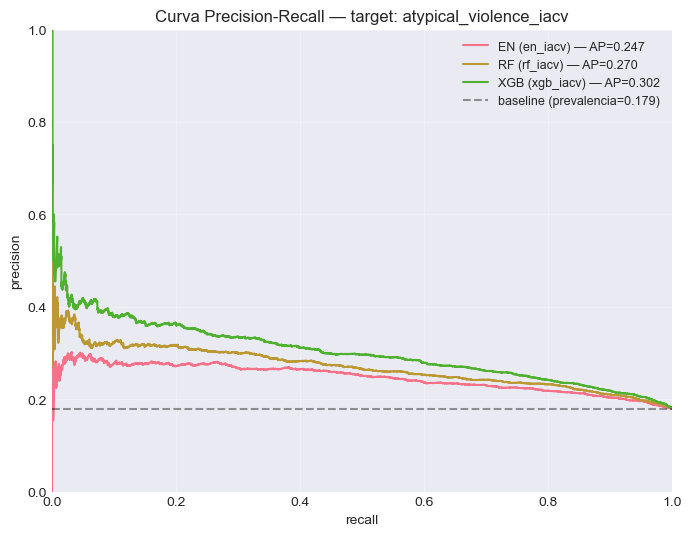

guardada: pr_curve_atypical_violence_iacv.png


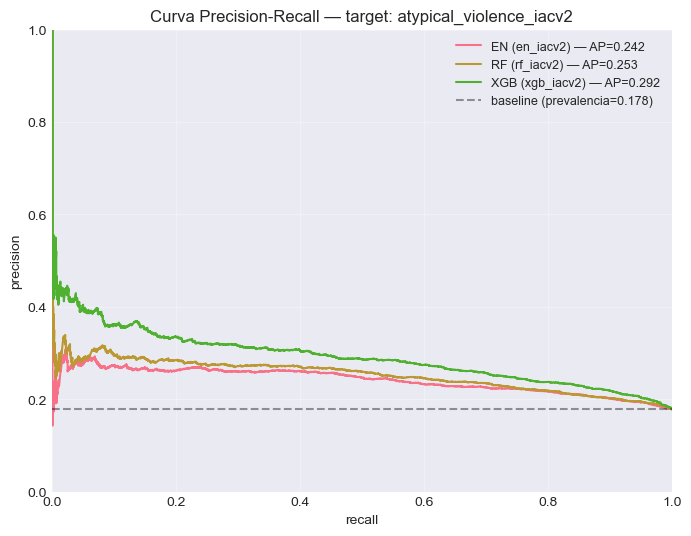

guardada: pr_curve_atypical_violence_iacv2.png


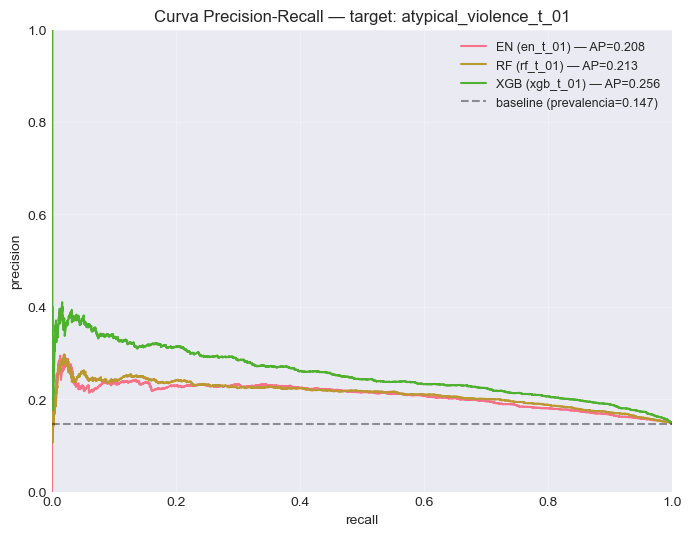

guardada: pr_curve_atypical_violence_t_01.png


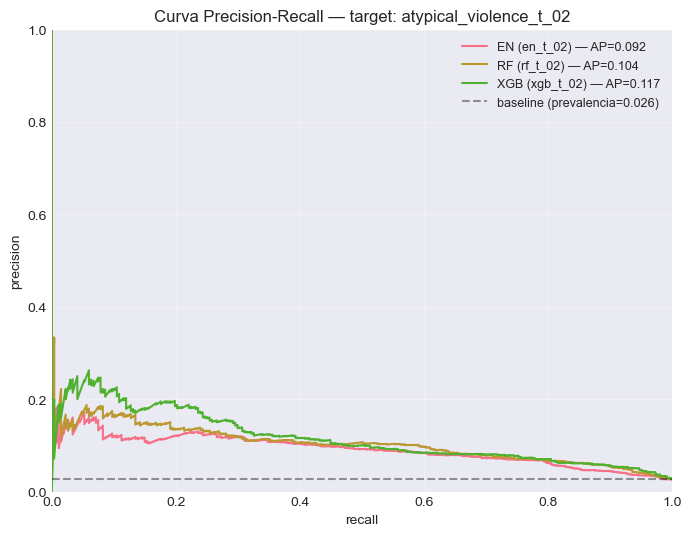

guardada: pr_curve_atypical_violence_t_02.png


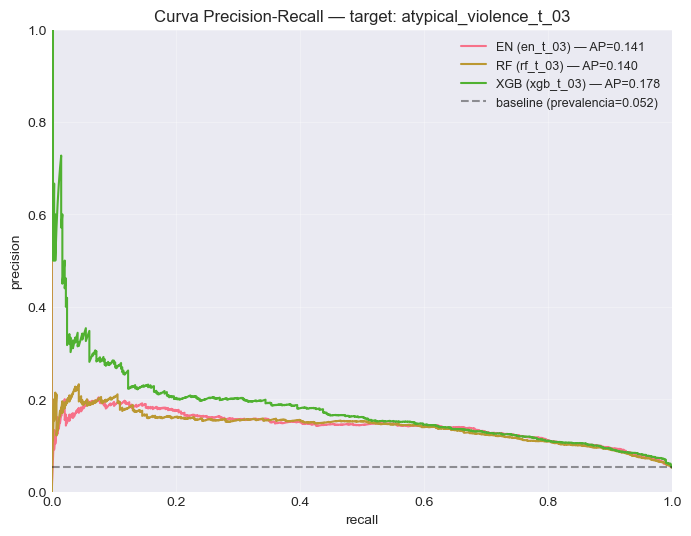

guardada: pr_curve_atypical_violence_t_03.png


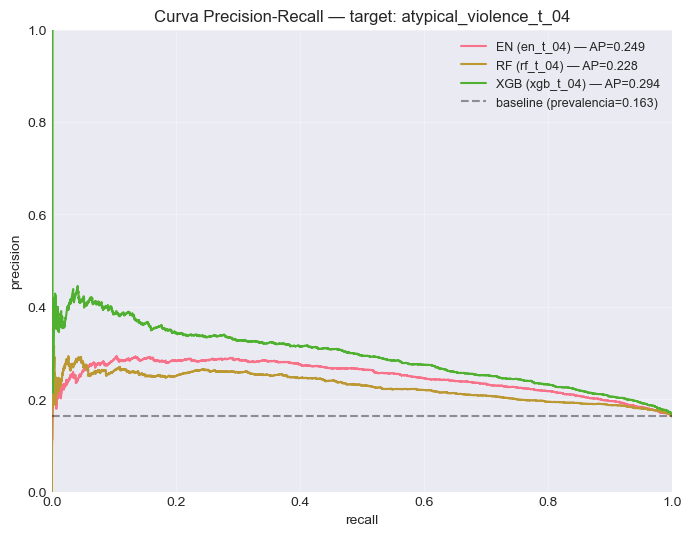

guardada: pr_curve_atypical_violence_t_04.png


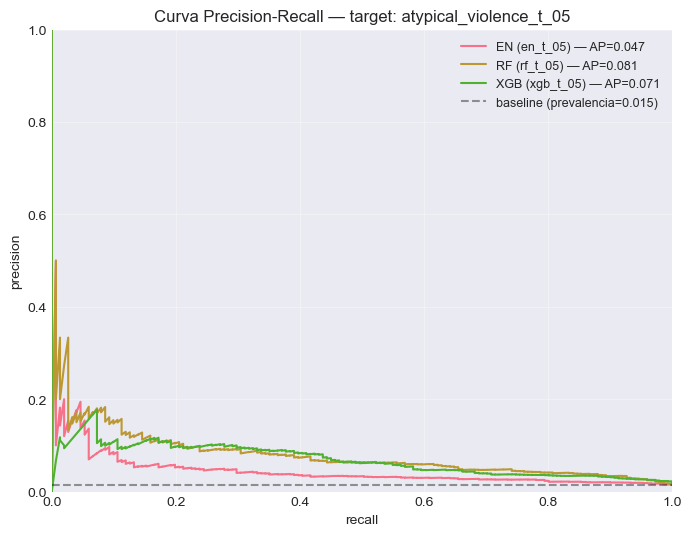

guardada: pr_curve_atypical_violence_t_05.png


In [6]:
targets = sorted(df_all['target'].unique())

for tgt in targets:
    df_t = df_all.query("target == @tgt")
    experiments = sorted(df_t['experiment'].unique())

    fig, ax = plt.subplots(figsize=(8, 6))

    for exp in experiments:
        grp = df_t.query("experiment == @exp")
        prec, rec, _ = precision_recall_curve(grp['y_true'], grp['y_proba'])
        ap = average_precision_score(grp['y_true'], grp['y_proba'])
        model_label = f"{grp['model'].iloc[0].upper()} ({exp}) — AP={ap:.3f}"
        ax.plot(rec, prec, label=model_label)

    baseline = df_t['y_true'].mean()
    ax.axhline(baseline, linestyle='--', color='k', alpha=0.4,
               label=f'baseline (prevalencia={baseline:.3f})')

    ax.set_xlabel('recall')
    ax.set_ylabel('precision')
    ax.set_title(f'Curva Precision-Recall — target: {tgt}')
    ax.legend(loc='upper right', fontsize=9)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.grid(True, alpha=0.3)

    fig_path = fig_dir / f'pr_curve_{tgt}.png'
    plt.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f'guardada: {fig_path.name}')

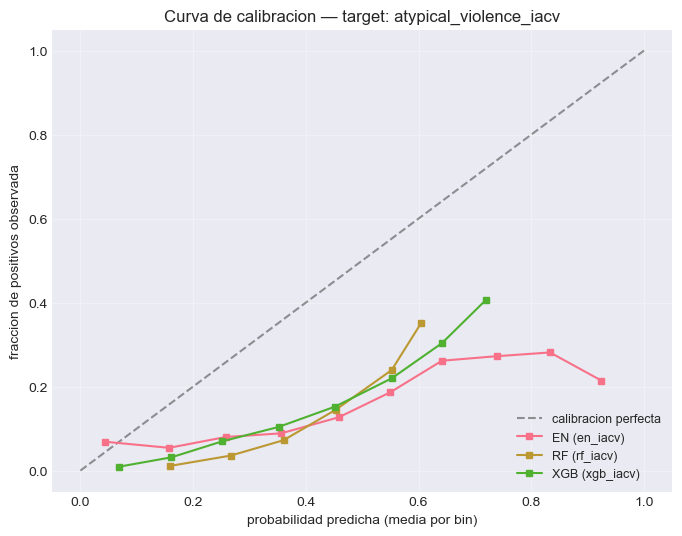

guardada: calibration_atypical_violence_iacv.png


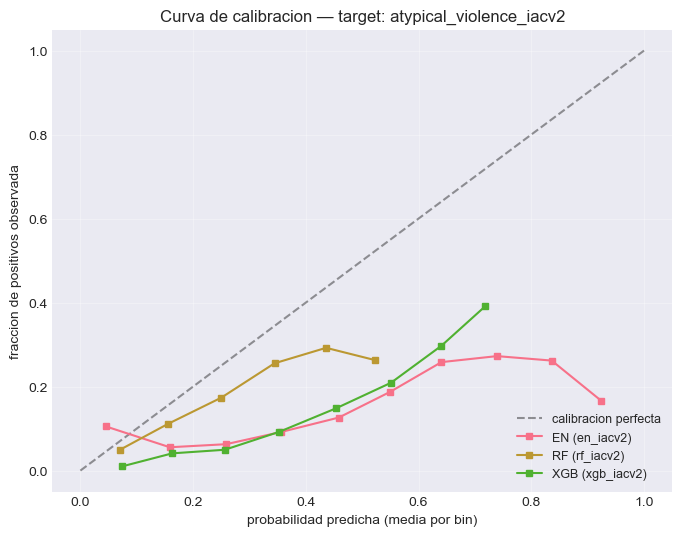

guardada: calibration_atypical_violence_iacv2.png


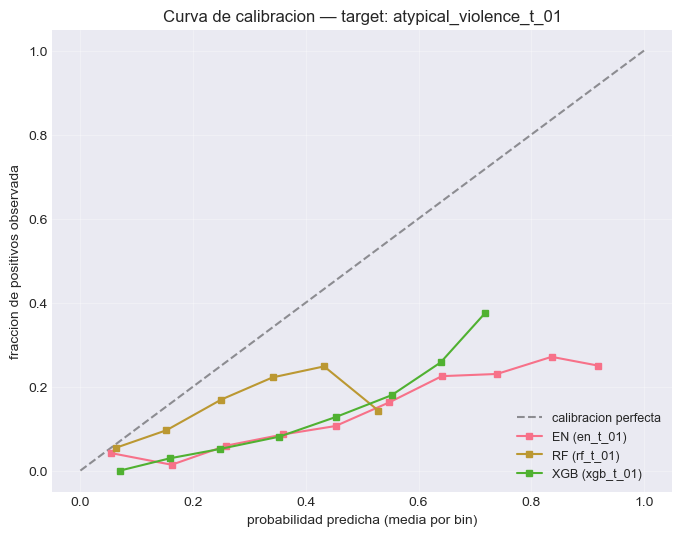

guardada: calibration_atypical_violence_t_01.png


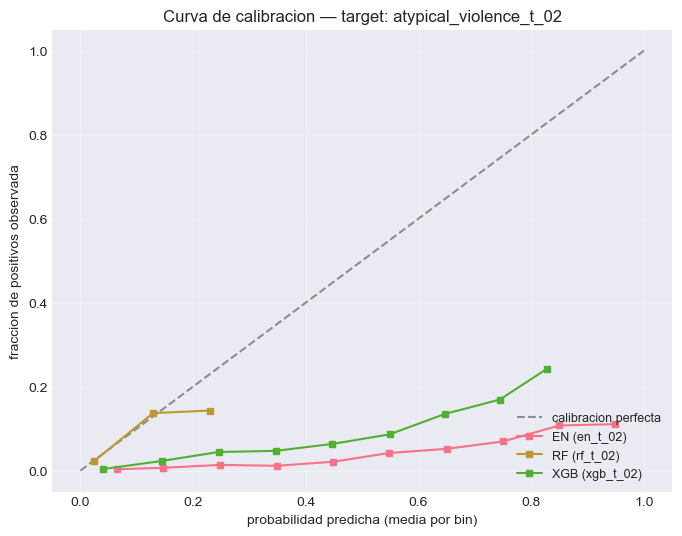

guardada: calibration_atypical_violence_t_02.png


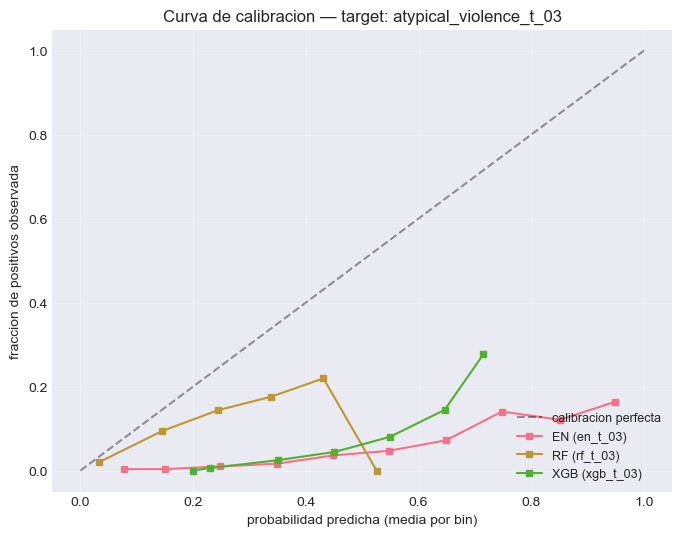

guardada: calibration_atypical_violence_t_03.png


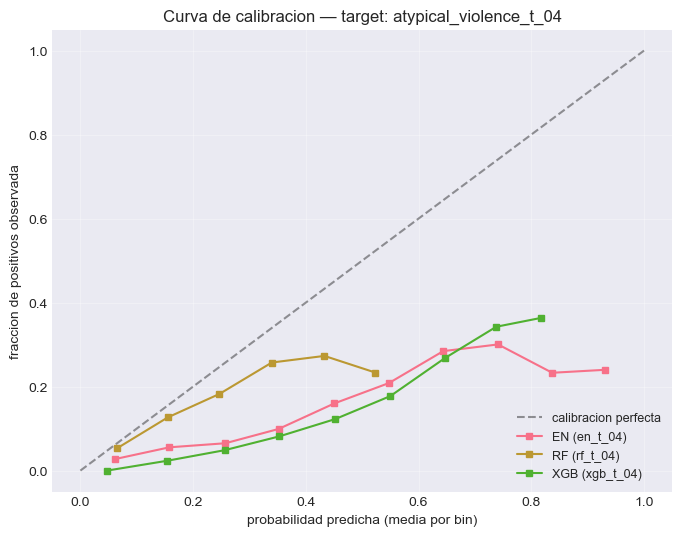

guardada: calibration_atypical_violence_t_04.png


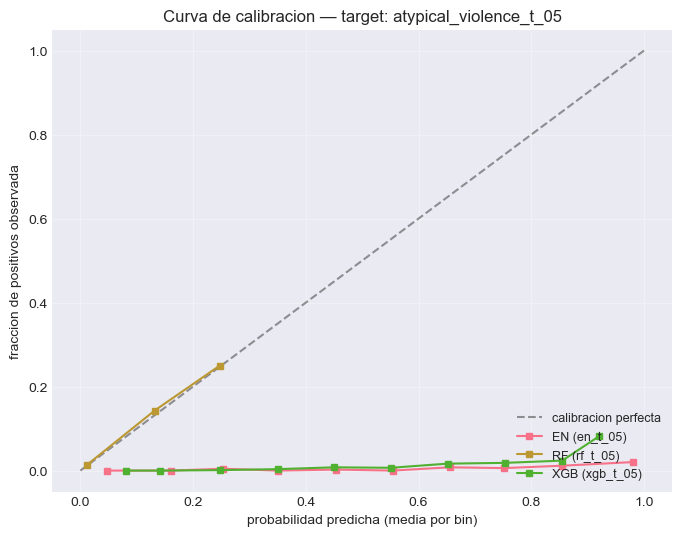

guardada: calibration_atypical_violence_t_05.png


In [7]:
targets = sorted(df_all['target'].unique())

for tgt in targets:
    df_t = df_all.query("target == @tgt")
    experiments = sorted(df_t['experiment'].unique())

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.4, label='calibracion perfecta')

    for exp in experiments:
        grp = df_t.query("experiment == @exp")
        model_label = f"{grp['model'].iloc[0].upper()} ({exp})"
        prob_true, prob_pred = calibration_curve(
            grp['y_true'], grp['y_proba'], n_bins=10, strategy='uniform'
        )
        ax.plot(prob_pred, prob_true, 's-', label=model_label, markersize=5)

    ax.set_xlabel('probabilidad predicha (media por bin)')
    ax.set_ylabel('fraccion de positivos observada')
    ax.set_title(f'Curva de calibracion — target: {tgt}')
    ax.legend(loc='lower right', fontsize=9)
    ax.grid(True, alpha=0.3)

    fig_path = fig_dir / f'calibration_{tgt}.png'
    plt.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f'guardada: {fig_path.name}')

---
## 4. Matrices de confusion

Una matriz por experimento.

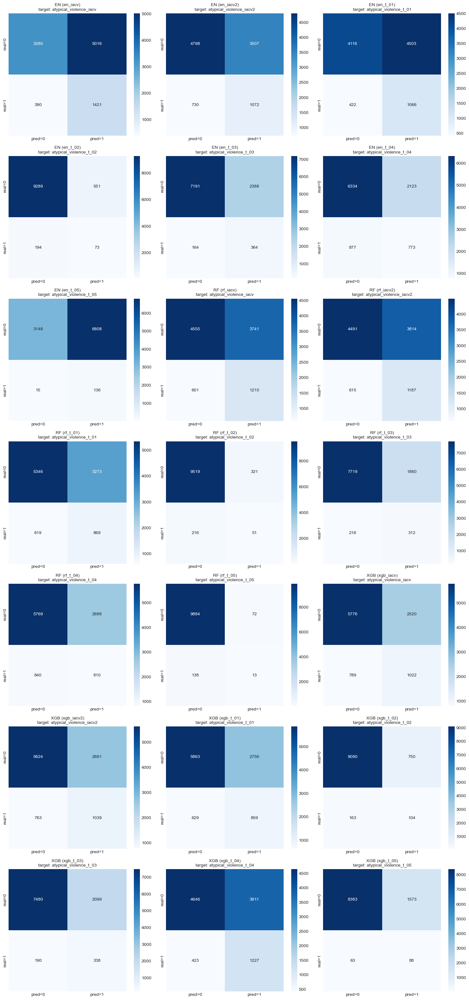

guardada: confusion_matrices.png


In [8]:
experiments = sorted(df_all['experiment'].unique())
n_exp = len(experiments)
n_cols = min(3, n_exp)
n_rows = int(np.ceil(n_exp / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4.5 * n_rows))
axes = np.atleast_2d(axes)

for idx, exp in enumerate(experiments):
    r, c = divmod(idx, n_cols)
    ax = axes[r, c]
    grp = df_all.query("experiment == @exp")
    cm = confusion_matrix(grp['y_true'], grp['y_pred'])
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues', ax=ax,
        xticklabels=['pred=0', 'pred=1'],
        yticklabels=['real=0', 'real=1'],
    )
    model = grp['model'].iloc[0].upper()
    target = grp['target'].iloc[0]
    ax.set_title(f'{model} ({exp})\ntarget: {target}', fontsize=10)

# ocultar ejes sobrantes
for idx in range(n_exp, n_rows * n_cols):
    r, c = divmod(idx, n_cols)
    axes[r, c].set_visible(False)

plt.tight_layout()
fig_path = fig_dir / 'confusion_matrices.png'
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'guardada: {fig_path.name}')

---
## 5. Metricas por municipio

Calcula recall, precision y F1 a nivel municipal para cada experimento.

In [13]:
def safe_metric(yt, yp, metric_fn):
    """Calcula metrica; retorna NaN si no hay varianza."""
    if len(yt) == 0 or yt.nunique() < 2:
        return np.nan
    return metric_fn(yt, yp, zero_division=0)

mun_rows = []
for (exp, mun), grp in df_all.groupby(['experiment', 'mun_code']):
    yt = grp['y_true']
    yp = grp['y_pred']
    mun_rows.append({
        'experiment': exp,
        'model':      grp['model'].iloc[0],
        'target':     grp['target'].iloc[0],
        'mun_code':   mun,
        'n_obs':      len(grp),
        'n_pos':      int(yt.sum()),
        'recall':     safe_metric(yt, yp, recall_score),
        'precision':  safe_metric(yt, yp, precision_score),
        'f1':         safe_metric(yt, yp, f1_score),
    })

df_mun = pd.DataFrame(mun_rows)
print(f'metricas municipales calculadas: {len(df_mun):,} filas')
print(f'experimentos: {sorted(df_mun["experiment"].unique())}')
df_mun

metricas municipales calculadas: 23,583 filas
experimentos: ['en_iacv', 'en_iacv2', 'en_t_01', 'en_t_02', 'en_t_03', 'en_t_04', 'en_t_05', 'rf_iacv', 'rf_iacv2', 'rf_t_01', 'rf_t_02', 'rf_t_03', 'rf_t_04', 'rf_t_05', 'xgb_iacv', 'xgb_iacv2', 'xgb_t_01', 'xgb_t_02', 'xgb_t_03', 'xgb_t_04', 'xgb_t_05']


,experiment,model,target,mun_code,n_obs,n_pos,recall,precision,f1
0,en_iacv,en,atypical_violence_iacv,05001,9,2,1.0,0.400000,0.571429
1,en_iacv,en,atypical_violence_iacv,05002,9,1,1.0,0.200000,0.333333
2,en_iacv,en,atypical_violence_iacv,05004,9,0,NaN,NaN,NaN
3,en_iacv,en,atypical_violence_iacv,05021,9,1,1.0,0.166667,0.285714
4,en_iacv,en,atypical_violence_iacv,05030,9,3,1.0,0.333333,0.500000
...,...,...,...,...,...,...,...,...,...
23578,xgb_t_05,xgb,atypical_violence_t_05,97889,9,0,NaN,NaN,NaN
23579,xgb_t_05,xgb,atypical_violence_t_05,99001,9,0,NaN,NaN,NaN
23580,xgb_t_05,xgb,atypical_violence_t_05,99524,9,0,NaN,NaN,NaN
23581,xgb_t_05,xgb,atypical_violence_t_05,99624,9,0,NaN,NaN,NaN


---
## 6. Mapas municipales de desempeno

Descarga la geometria de municipios de Colombia desde el MGN 2018 (DANE) y genera heatmaps de recall, precision y F1 por municipio para cada experimento.

In [10]:
import geopandas as gpd

# geometria municipal — MGN 2018 (DANE)
GEO_URL = 'https://raw.githubusercontent.com/caticoa3/colombia_mapa/master/co_2018_MGN_MPIO_POLITICO.geojson'

gdf_mun = gpd.read_file(GEO_URL)
gdf_mun['mun_code'] = gdf_mun['MPIO_CCNCT'].astype(str).str.zfill(5)

print(f'geometrias cargadas: {len(gdf_mun)} municipios')
gdf_mun[['mun_code', 'MPIO_CNMBR', 'DPTO_CNMBR']].head(3)

geometrias cargadas: 1122 municipios


,mun_code,MPIO_CNMBR,DPTO_CNMBR
0,18001,FLORENCIA,CAQUETÁ
1,18029,ALBANIA,CAQUETÁ
2,18094,BELÉN DE LOS ANDAQUÍES,CAQUETÁ


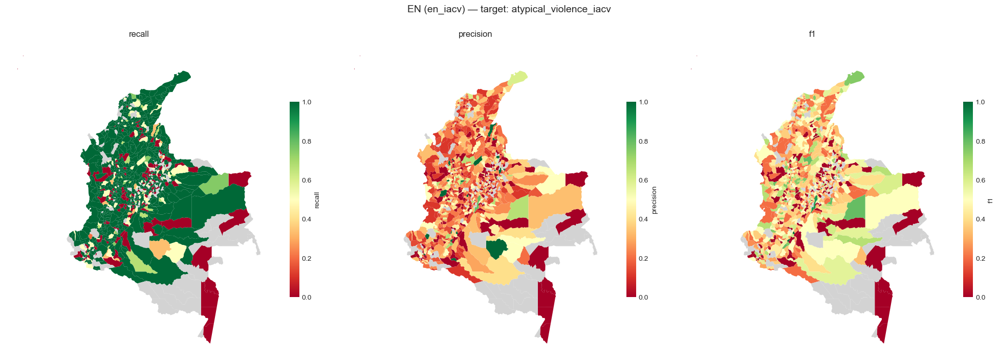

guardado: map_en_iacv.png


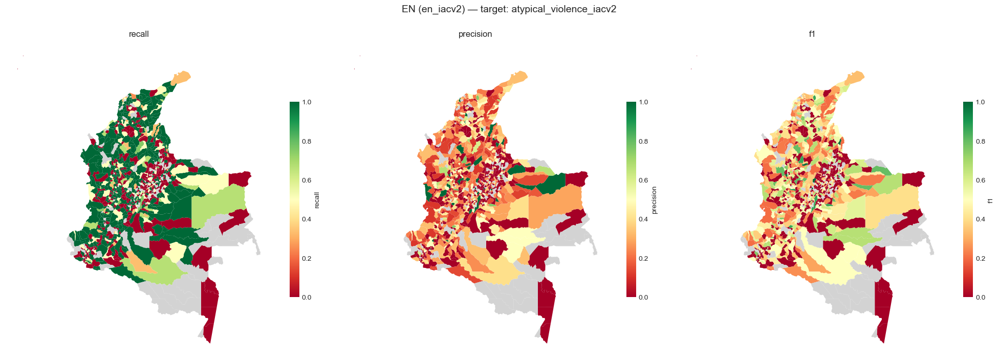

guardado: map_en_iacv2.png


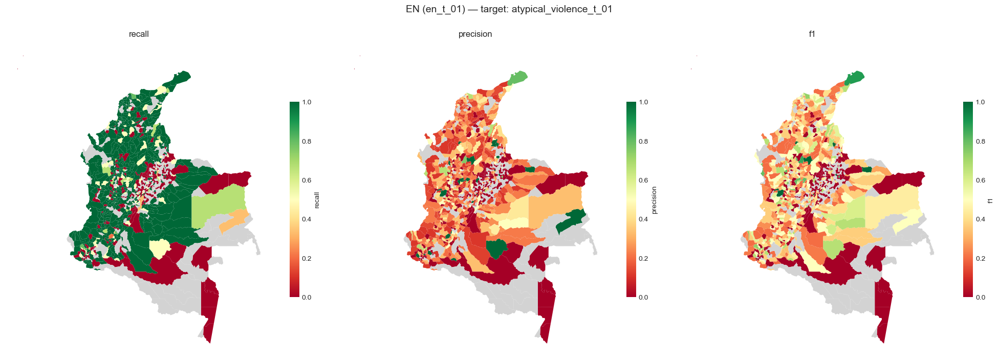

guardado: map_en_t_01.png


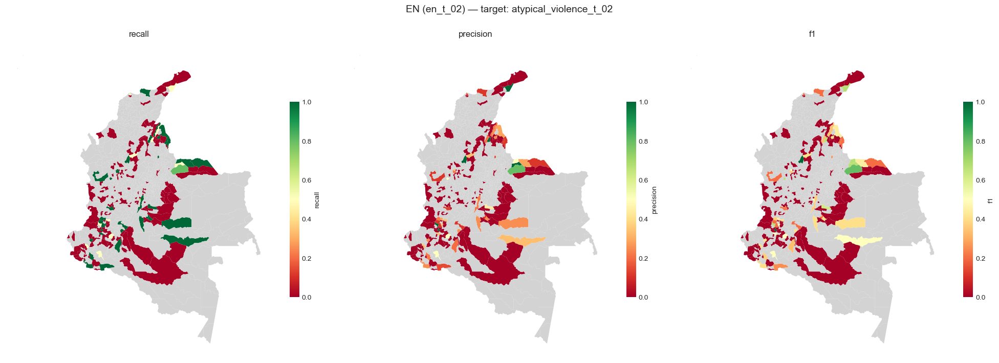

guardado: map_en_t_02.png


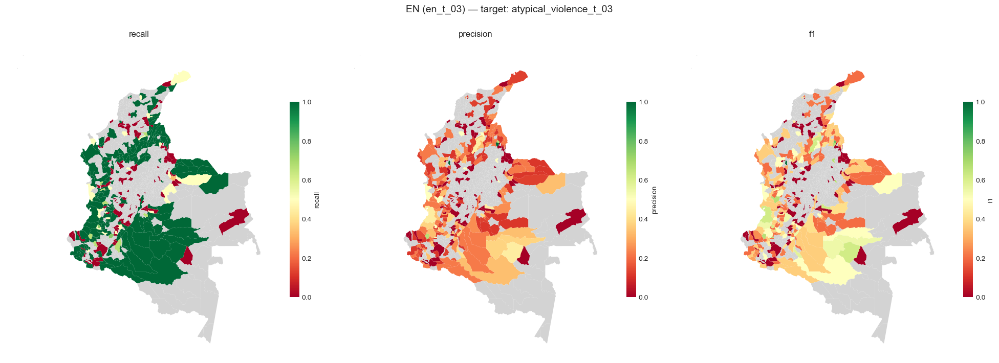

guardado: map_en_t_03.png


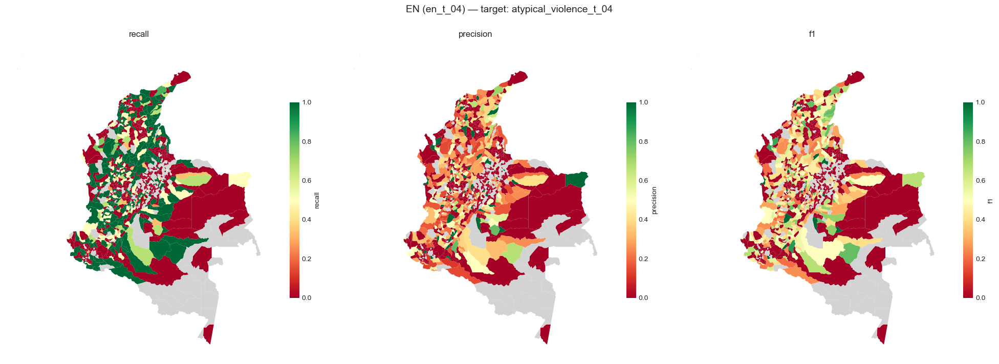

guardado: map_en_t_04.png


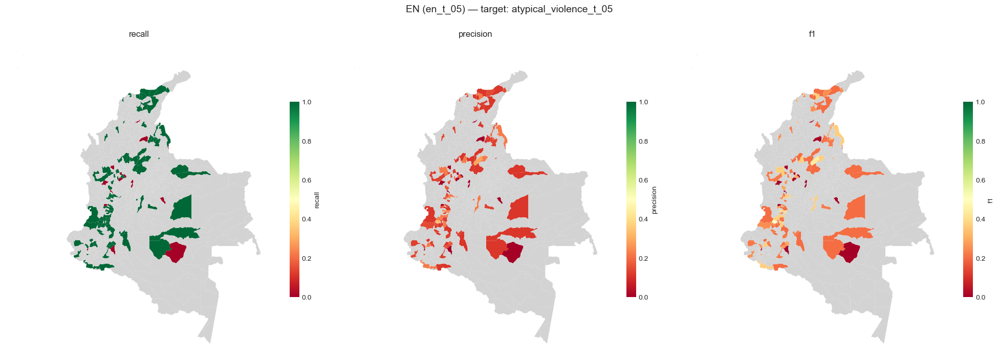

guardado: map_en_t_05.png


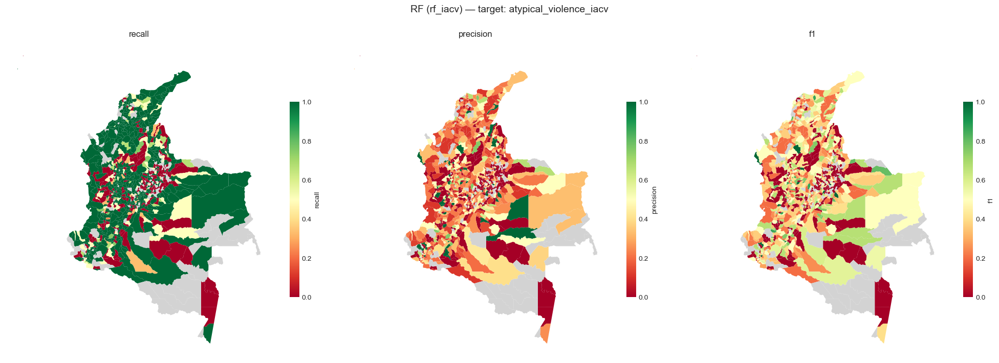

guardado: map_rf_iacv.png


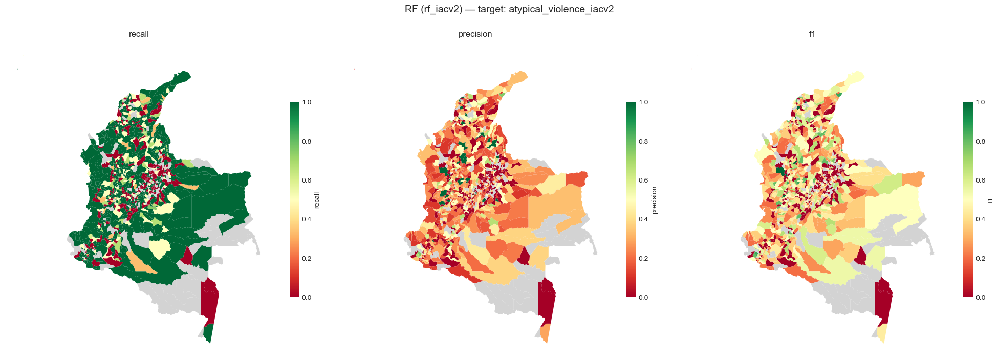

guardado: map_rf_iacv2.png


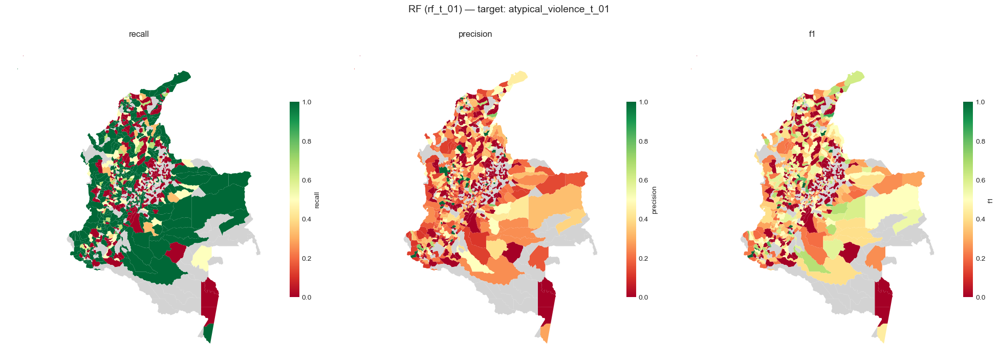

guardado: map_rf_t_01.png


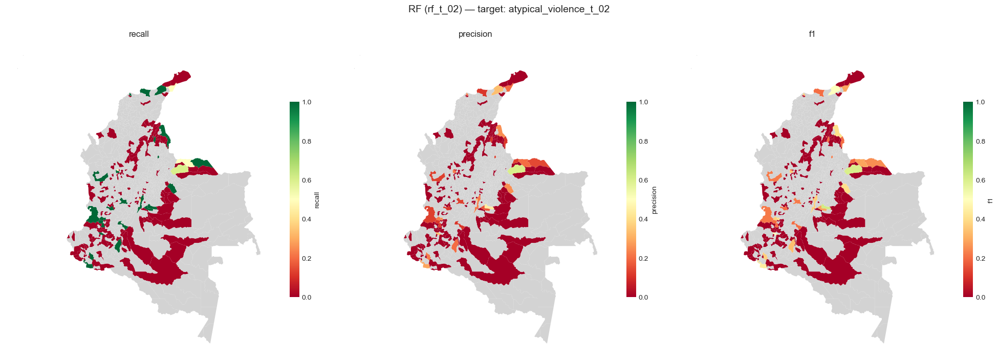

guardado: map_rf_t_02.png


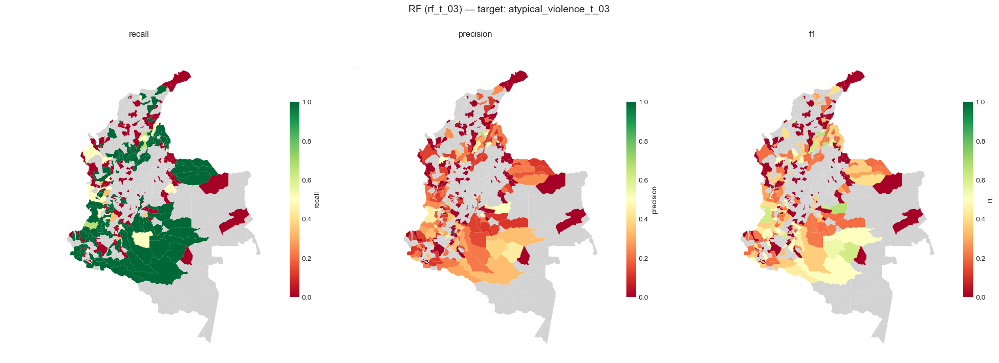

guardado: map_rf_t_03.png


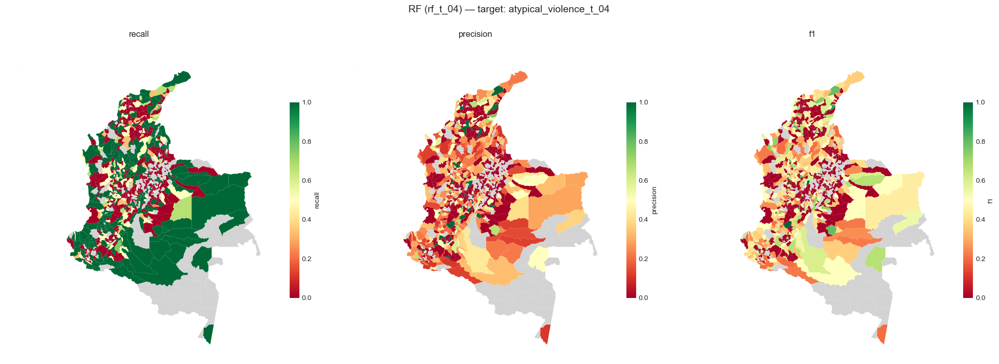

guardado: map_rf_t_04.png


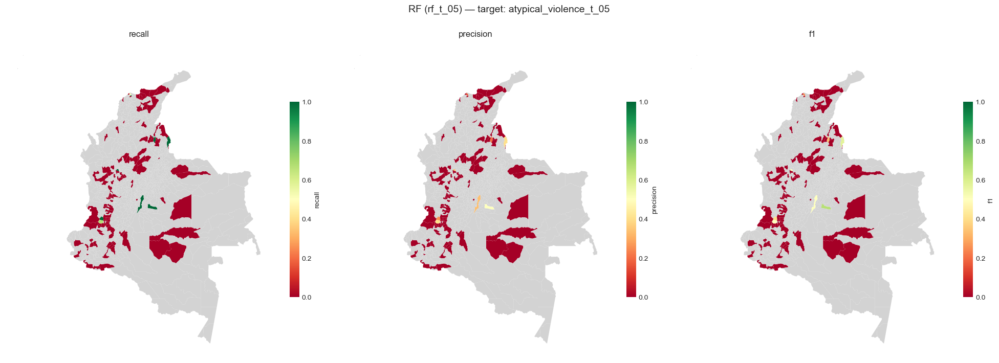

guardado: map_rf_t_05.png


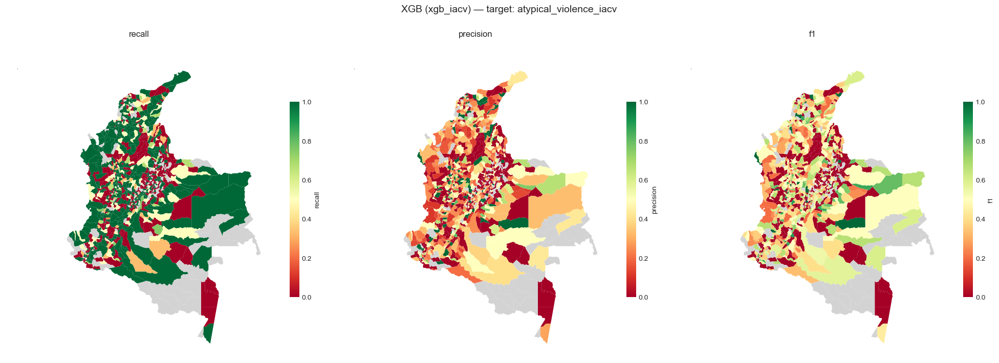

guardado: map_xgb_iacv.png


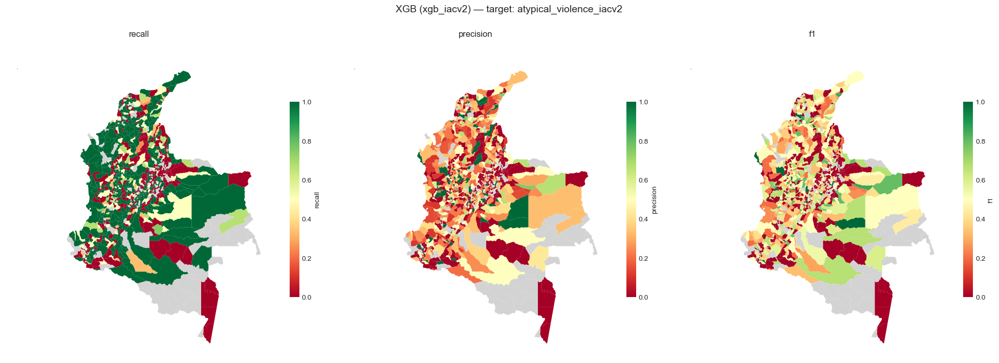

guardado: map_xgb_iacv2.png


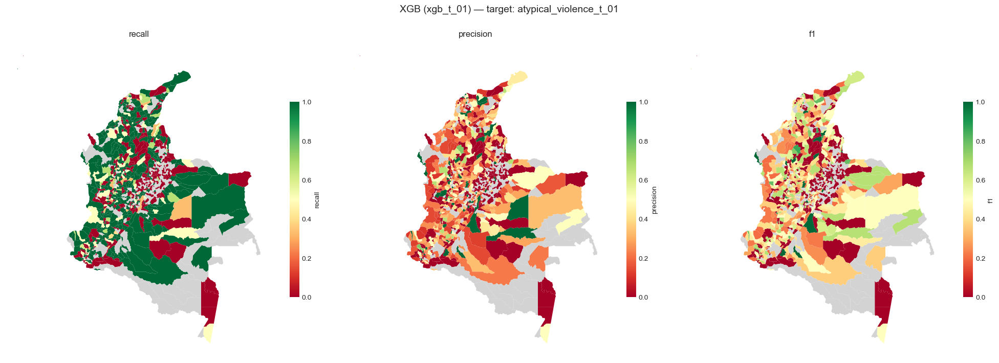

guardado: map_xgb_t_01.png


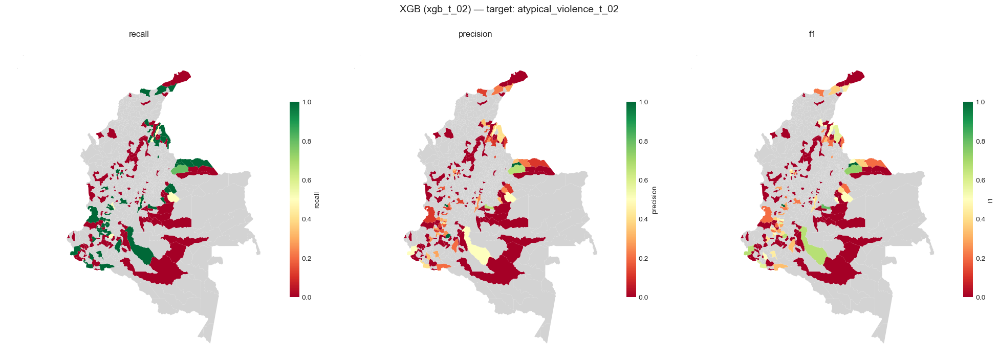

guardado: map_xgb_t_02.png


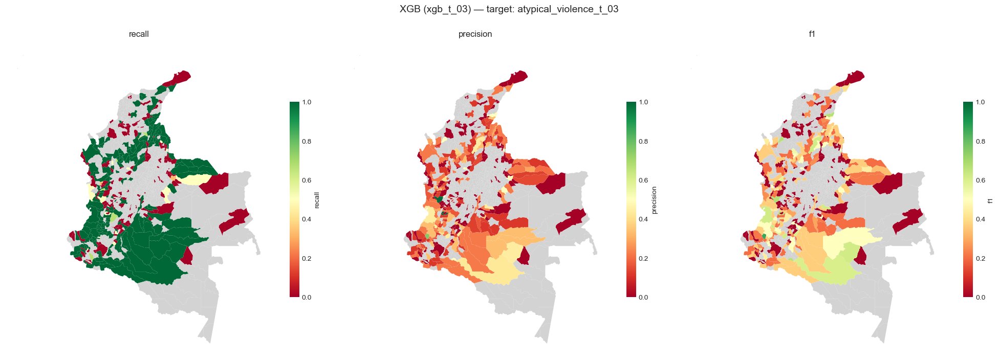

guardado: map_xgb_t_03.png


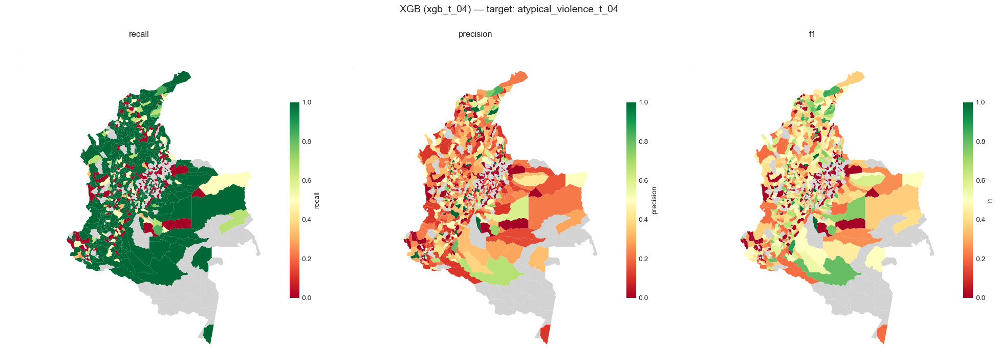

guardado: map_xgb_t_04.png


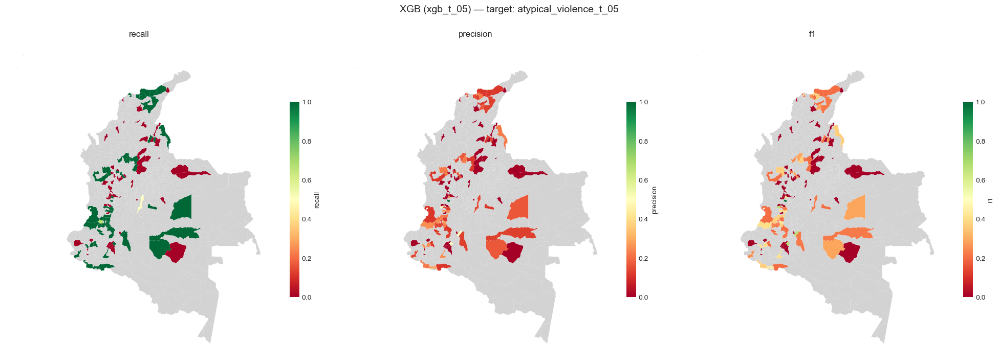

guardado: map_xgb_t_05.png


In [11]:
# asegurar que mun_code sea string de 5 digitos en ambos DFs
df_mun['mun_code'] = df_mun['mun_code'].astype(str).str.zfill(5)

map_metrics = ['recall', 'precision', 'f1']

for exp in sorted(df_mun['experiment'].unique()):
    df_exp = df_mun.query("experiment == @exp")
    model = df_exp['model'].iloc[0].upper()
    target = df_exp['target'].iloc[0]

    gdf_plot = gdf_mun.merge(df_exp[['mun_code'] + map_metrics], on='mun_code', how='left')

    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    for i, metric in enumerate(map_metrics):
        ax = axes[i]
        gdf_plot.plot(
            column=metric, ax=ax, legend=True,
            cmap='RdYlGn', missing_kwds={'color': 'lightgrey', 'label': 'sin datos'},
            vmin=0, vmax=1,
            legend_kwds={'shrink': 0.6, 'label': metric},
        )
        ax.set_title(f'{metric}', fontsize=12)
        ax.axis('off')

    fig.suptitle(f'{model} ({exp}) — target: {target}', fontsize=14, y=1.02)
    plt.tight_layout()

    fig_path = fig_dir / f'map_{exp}.png'
    plt.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f'guardado: {fig_path.name}')

### Exportar metricas municipales

In [12]:
mun_xlsx = table_dir / 'municipal_metrics.xlsx'
df_mun.to_excel(mun_xlsx, index=False, float_format='%.4f')
print(f'metricas municipales exportadas: {mun_xlsx.name}')

metricas municipales exportadas: municipal_metrics.xlsx
